#### **0)  Prerequisites (Notes):**


Refer to ```qa_aggregate.py``` and ```preload_aggregate.py``` for the extraction process of temporal aggregates by annual, monthly, weekday-weekend, and hourly intervals from 2023 September and 2024 August. The plots and maps in this notebook were made accordingly using the processed images from implementing the functions in ```preload.aggregate.py``` on Atlantic Canada and the Quebec City-Windsor corridor spatial extents.

Furthermore, in the ```/download/``` folder, refer to ```tempo.py``` and ```tropomi.py``` for getting Level 3 data and grid coordinate (Latitude/Longitude) arrays of TEMPO and TROPOMI respectively. Meanwhile, the locations of surface regulatory monitors were based on the outputs from ```airnow.py``` in the same folder. The Canadian census tract / dissemination area boundaries were used in city-level mapping, refer to ```census.py``` for details.

Below lists all the packages required for running this notebook.

In [ ]:
!pip install contextily
!pip install geoplot
!pip install rioxarray
!pip install basemap-data-hires
!pip install basemap
!pip install matplotlib_scalebar
!pip install exactextract

In [ ]:
import numpy as np
import xarray as xr
import rioxarray as rxr
import rasterio as rio
import pandas as pd
import geopandas as gpd
import exactextract as eet
import math
import os
import pickle
import copy
import contextily
import seaborn

In [ ]:
from matplotlib import pyplot as plt
from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib import gridspec
from matplotlib import colors
from matplotlib import colorbar
from matplotlib import ticker
from shapely import Polygon, Point
from shapely.ops import nearest_points
from rasterio.fill import fillnodata
from scipy import ndimage
from osgeo import gdal

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
###  subsetting spatial extent

def generate_geographical_subset(data_arrays, latmin, latmax, lonmin, lonmax):

    return data_arrays.where(
              (data_arrays.y < latmax) &
              (data_arrays.y > latmin) &
              (data_arrays.x < lonmax) &
              (data_arrays.x > lonmin),
            drop=True)

In [ ]:
####  accommodate numpy arrays to xarray datasets

def fetch_plot_Xr(aggregate, coords, full_range=False):

    plot_gdf = copy.deepcopy(coords)
    plot_gdf["observation"] = aggregate.flatten()

    plot_xr = xr.Dataset.from_dataframe(plot_gdf.set_index(['longitude','latitude'])).drop_vars('geometry')
    plot_xr = plot_xr.rio.write_crs("epsg:4326")
    plot_xr = plot_xr.rename({"longitude": "x", "latitude": "y"})
    plot_xr = plot_xr.transpose("y", "x")
    plot_xr = plot_xr.reindex(y=list(reversed(plot_xr.y)))

    return plot_xr

In [ ]:
###  city-level geometry for the eight selected municipalities

def city_subset(pname, source_xr, interp=True):

    subset_plot_xr = generate_geographical_subset(source_xr,
                                                  min(pc_coords[pname][1]) - 0.02,
                                                  max(pc_coords[pname][1]) + 0.02,
                                                  min(pc_coords[pname][0]) - 0.02,
                                                  max(pc_coords[pname][0]) + 0.02)

    if interp:
        out = subset_plot_xr.interp(x = pc_coords[pname][0],
                                    y = pc_coords[pname][1],
                                    method = "linear")
    else:
        out = subset_plot_xr

    return out

In [ ]:
def city_convert_gdf(pname, source_xr):

    source_xr = source_xr.to_dataframe().reset_index()
    source_xr['y'] = source_xr['y'].apply(lambda x: round(x, 6))
    source_xr['x'] = source_xr['x'].apply(lambda x: round(x, 6))
    source_xr = pc_grids_coords[pname].merge(source_xr, left_on=["lon","lat"], right_on=["x","y"])

    return source_xr

In [ ]:
def city_plot(pname, source_xr, ax, aggregate_key=None, vmax=None, vmin=None, title=True, cmap="RdBu_r"):

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)

    if vmax != None and vmin != None:
        source_xr.plot(
            ax=ax,
            cax = cax,
            column="observation",
            cmap=cmap,
            edgecolor="0.8",
            linewidth=0.1,
            alpha=0.5,
            aspect=None,
            legend=True,
            legend_kwds={
                "shrink":0.9,
            },
            vmax=vmax,
            vmin=vmin
        )
    else:
        source_xr.plot(
            ax=ax,
            cax = cax,
            column="observation",
            cmap=cmap,
            edgecolor="0.8",
            linewidth=0.1,
            alpha=0.5,
            aspect=None,
            legend=True,
            legend_kwds={
                "shrink":0.9,
            }
        )

    contextily.add_basemap(
        ax=ax,
        crs="epsg:4326",
        source=contextily.providers.CartoDB.PositronNoLabels,
        zoom=12,
    )

    points = gpd.GeoSeries(
        [Point(min(pc_coords[pname][0]) - 0.02, min(pc_coords[pname][1]) - 0.02),
         Point(min(pc_coords[pname][0]) - 0.02 + 1.0, min(pc_coords[pname][1]) - 0.02)], crs=4326
    )
    points = points.to_crs(3347)
    scale_meters = points[0].distance(points[1])
    ax.add_artist(ScaleBar(scale_meters, font_properties={"size": 14}))

    if title:
        ax.set_title(pname + " " + aggregate_key, fontsize=15)

    cax.tick_params(labelsize=15)

In [ ]:
###  Data Source: 2021 Canadian Census of Population @ https://www12.statcan.gc.ca/census-recensement/2021/dp-pd/prof/index.cfm?Lang=E

#   download Ontario, Quebec, and Atlantic Canada for census tract population profiles
#   download Atlantic Canada for census tract population profiles (Cape Breton)
#   filter targeted population centers and keep only the "Population (2021)" field in advance

pop_das = pd.read_excel(f"./population/census_dissemination_areas.xlsx")
pop_cts = pd.read_excel(f"./population/census_tracts.xlsx")

#### **1.1) Weekday-Weekend Difference:**

In [ ]:
def make_wkday_outputs(city, wkday_xr, wkend_xr, percentage_difference = False):

    #  calculate absolute difference or percentage difference

    if percentage_difference == False:
        wk_delta_xr = wkday_xr - wkend_xr
    else:
        wk_delta_xr = (wkday_xr - wkend_xr) / wkend_xr * 100

    wkday_agg = copy.deepcopy(wkday_xr.observation.values)
    wkend_agg = copy.deepcopy(wkend_xr.observation.values)

    #  highlight weekday and weekend hotspot grids for plotting

    wkday_agg_high = np.nanpercentile(wkday_agg, 90)
    wkday_agg[wkday_agg > wkday_agg_high] = 1
    wkday_agg[wkday_agg != 1] = np.nan

    wkend_agg_high = np.nanpercentile(wkend_agg, 90)
    wkend_agg[wkend_agg > wkend_agg_high] = 1
    wkend_agg[wkend_agg != 1] = np.nan

    wkday_xr.observation.values = wkday_agg
    wkend_xr.observation.values = wkend_agg

    return wk_delta_xr, wkday_xr, wkend_xr

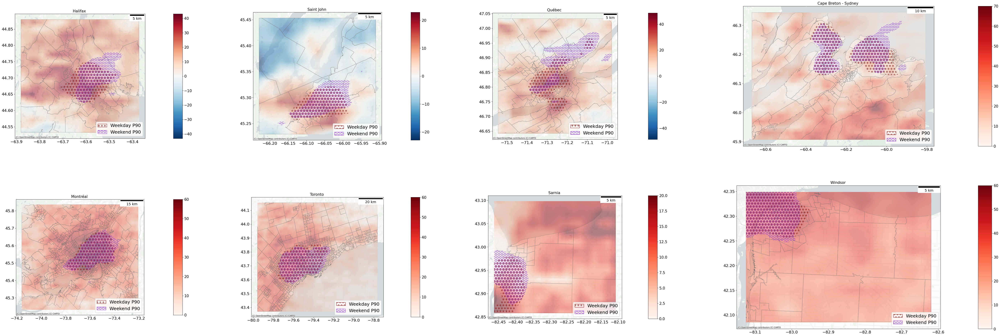

In [ ]:
fig = plt.figure(figsize=(16*3 + 24, 12*2))
gspec = gridspec.GridSpec(nrows=2, ncols=4, width_ratios=[1, 1, 1, 1.5], height_ratios=[1, 1])

plt.rc('hatch', color='k', linewidth=0.8)

plot_order = ["Halifax", "Saint John", "Québec", "Cape Breton - Sydney",
              "Montréal", "Toronto", "Sarnia", "Windsor"]

for c in range(len(plot_order)):

    city = plot_order[c]
    ax = plt.subplot(gspec[c])

    ax.tick_params(axis='both', which='major', labelsize=16)

    #  process city-level weekday-weekend difference xArray datasets

    if city in ["Cape Breton - Sydney", "Halifax", "Saint John"]:

        wkday_xr = city_subset(city, fetch_plot_Xr(no2_wkday_binary_multi_months_atl["weekday"], coord_atl_gdf))
        wkend_xr = city_subset(city, fetch_plot_Xr(no2_wkday_binary_multi_months_atl["weekend"], coord_atl_gdf))

    elif city in ["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:

        wkday_xr = city_subset(city, fetch_plot_Xr(no2_wkday_binary_multi_months_qw["weekday"], coord_qw_gdf))
        wkend_xr = city_subset(city, fetch_plot_Xr(no2_wkday_binary_multi_months_qw["weekend"], coord_qw_gdf))

    wk_delta_xr, wkday_agg_xr, wkend_agg_xr = make_wkday_outputs(city, wkday_xr, wkend_xr, percentage_difference = True)
    wk_delta_xr, wkday_agg_xr, wkend_agg_xr = city_convert_gdf(city, wk_delta_xr), city_convert_gdf(city, wkday_agg_xr), city_convert_gdf(city, wkend_agg_xr)

    #  determine the color gradient palette (monotonic or contrasting)

    if np.nanmin(wk_delta_xr.observation.values) > -10:
        cmap = "Reds"
        vmax = round(max(wk_delta_xr.observation), -1)
        vmin = 0
    else:
        cmap = "RdBu_r"
        vmax = max(abs(min(wk_delta_xr.observation)), max(wk_delta_xr.observation))
        vmin = max(abs(min(wk_delta_xr.observation)), max(wk_delta_xr.observation)) * -1

    #  plot weekday-weekend differences (percentage) on grids within the city

    city_plot(city, wk_delta_xr, ax, aggregate_key = "",
              vmax = vmax,
              vmin = vmin,
              title=True, cmap = cmap)

    #  plot census tracts boundaries at the background

    if city == "Cape Breton - Sydney":
        intersect_das[city].plot(ax=ax, facecolor="none", edgecolor="dimgrey", linewidth=0.4)
    else:
        intersect_cts[city].plot(ax=ax, facecolor="none", edgecolor="dimgrey", linewidth=0.4)

    #  plot weekday and weekend hotspots respectively

    wkday_agg_xr[~pd.isnull(wkday_agg_xr["observation"])].plot(ax=ax, facecolor="none", edgecolor="maroon", linewidth=0, hatch="o", label = "Weekday P90", aspect=None)
    wkend_agg_xr[~pd.isnull(wkend_agg_xr["observation"])].plot(ax=ax, facecolor="none", edgecolor="blueviolet", linewidth=0, hatch="O", label = "Weekend P90", aspect=None)

    #  formatting

    lines = [
        Patch(facecolor="none", edgecolor=t.get_edgecolor(), hatch=t.get_hatch())
        for t in ax.collections[-2:]
    ]
    labels = [t.get_label() for t in ax.collections[-2:]]
    ax.legend(lines, labels, loc="lower right", prop={'size': 18})

#### **1.2) Stratified by Seasons and Weekday-Weekend groups:**

In [ ]:
def make_seasonal_wkday_outputs(city, no2_wkday_seasonal, coords, census_unit_data, population_data):

    ##  interpolated grids at 0.002 x 0.002 (200 m x 200 m) within each city

    city_xr = xr.Dataset.from_dataframe(pc_grids_coords[city].set_index(['lon','lat'])).drop_vars('geometry')
    city_xr = city_xr.rio.write_crs("epsg:4326")
    city_xr = city_xr.rename({"lon": "x", "lat": "y"})
    city_xr = city_xr.transpose("y", "x")
    city_xr = city_xr.reindex(y=list(reversed(city_xr.y)))

    ##  extract area-weighted mean TEMPO tropospheric NO2 VCD stratified by weekday-weekend and seasonal splits

    for h in no2_wkday_seasonal.keys():
        for g in ["weekday", "weekend"]:

            city_subset_xr = fetch_plot_Xr(no2_wkday_seasonal[h][g], coords)
            city_interp = city_subset(city, city_subset_xr)
            city_zs = eet.exact_extract(city_interp, census_unit_data[city], 'mean')
            city_zs = [city_zs[n]['properties']['mean'] for n in range(census_unit_data[city].shape[0])]
            census_unit_data[city]["tempo_no2_" + h + "_" + g] = pd.Series(city_zs)

    ##  merge with census unit population in 2021

    census_unit_data[city] = census_unit_data[city].merge(population_data[["DGUID","Population"]], on="DGUID", how="left")

    out = pd.melt(census_unit_data[city], id_vars=["DGUID","geometry","PCNAME","included","Population"])
    out["season"] = out["variable"].apply(lambda x: x.replace("tempo_no2_","").split("_")[0])
    out["days"] = out["variable"].apply(lambda x: x.replace("tempo_no2_","").split("_")[1])
    out = out[(out["Population"] > 0) & (~pd.isnull(out['value']))].reset_index(drop=True)

    return out

In [ ]:
order = ["Halifax", "Saint John", "Québec", "Cape Breton - Sydney",
         "Montréal", "Toronto", "Sarnia", "Windsor"]

season_wkday_exposure = []

for c in range(len(order)):

    city = order[c]

    if city in ["Halifax", "Saint John"]:
        out = make_seasonal_wkday_outputs(
            city, no2_wkday_seasonal_atl, coord_atl_gdf, within_cts, pop_cts
        )
    elif city in ["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:
        out = make_seasonal_wkday_outputs(
            city, no2_wkday_seasonal_qw, coord_qw_gdf, within_cts, pop_cts
        )
    else:
        out = make_seasonal_wkday_outputs(
            city, no2_wkday_seasonal_atl, coord_atl_gdf, within_das, pop_das
        )

    season_wkday_exposure.append(out)

season_wkday_exposure = pd.concat(season_wkday_exposure)
season_wkday_exposure.columns = ["DGUID","geometry","PCNAME","included","Population","var","census_unit_no2","season","days"]
season_wkday_exposure['census_unit_no2'] = season_wkday_exposure['census_unit_no2'] / 1e15

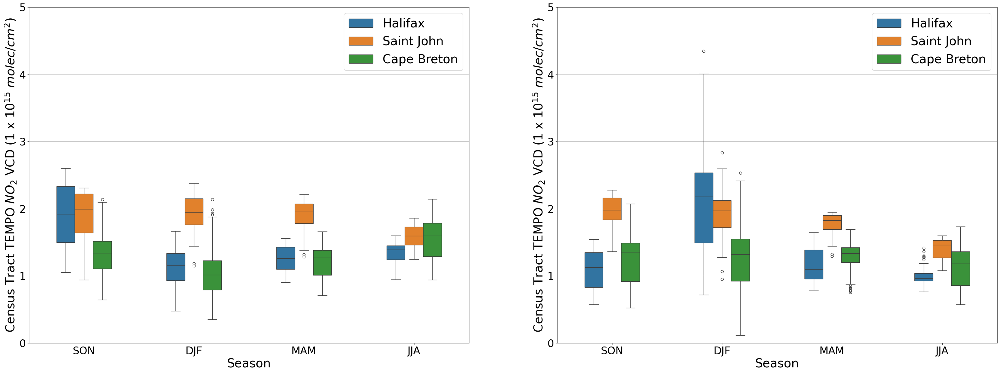

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(40, 14))

max_val = np.nanmax(season_wkday_exposure[season_wkday_exposure["PCNAME"].isin(["Halifax", "Saint John", "Cape Breton - Sydney"])]["census_unit_no2"])

c_count = 0

for w in ['weekday','weekend']:

    plot_df = season_wkday_exposure[(season_wkday_exposure["days"] == w) &
                                    (season_wkday_exposure["PCNAME"].isin(["Halifax", "Saint John", "Cape Breton - Sydney"]))]

    plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Halifax", "Saint John", "Cape Breton - Sydney"])

    plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

    seaborn.boxplot(
        data = plot_df,
        x = "season", y = "census_unit_no2", hue="PCNAME",
        width=0.5,
        ax = ax[c_count]
    )
    ax[c_count].set_ylim(0, round(max_val, 0) + 1)
    ax[c_count].set_ylabel("Census Tract TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=28)
    ax[c_count].set_xlabel("Season", size=28)
    ax[c_count].tick_params(axis='both', which='major', labelsize=24)
    ax[c_count].legend(title="", prop={'size': 28})
    ax[c_count].yaxis.grid(True)

    c_count += 1

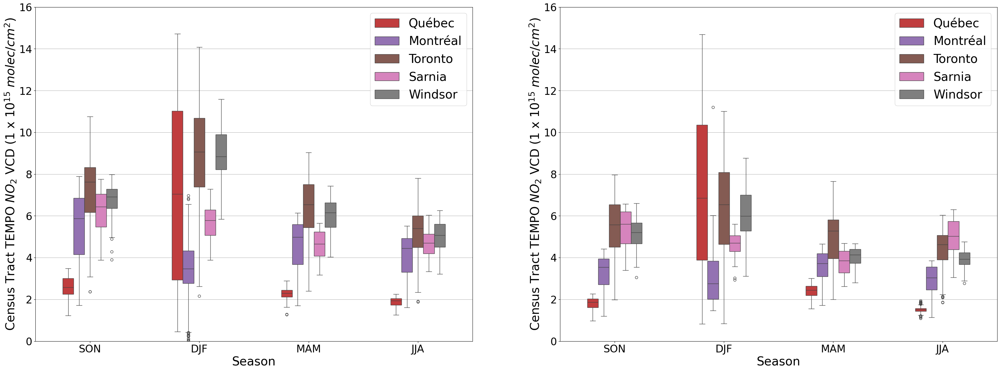

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(40, 14))

max_val = np.nanmax(season_wkday_exposure[season_wkday_exposure["PCNAME"].isin(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"])]["census_unit_no2"])

c_count = 0
cmap = colors.ListedColormap(plt.cm.tab10.colors[3:])

for w in ['weekday','weekend']:

    plot_df = season_wkday_exposure[(season_wkday_exposure["days"] == w) &
                                    (season_wkday_exposure["PCNAME"].isin(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]))]

    plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"])

    seaborn.boxplot(
        data = plot_df,
        x = "season", y = "census_unit_no2", hue="PCNAME",
        width=0.5,
        palette = np.array(seaborn.color_palette())[3:],
        ax = ax[c_count]
    )
    ax[c_count].set_ylim(0, round(max_val, 0) + 1)
    ax[c_count].set_ylabel("Census Tract TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=28)
    ax[c_count].set_xlabel("Season", size=28)
    ax[c_count].tick_params(axis='both', which='major', labelsize=24)
    ax[c_count].legend(title="", prop={'size': 28})
    ax[c_count].yaxis.grid(True)

    c_count += 1

#### **2) Diurnal Hourly NO<sub>2</sub> VCD stratified by Seasons and Weekday-Weekend groups:**

In [ ]:
def make_wkday_hour_mean(city, no2_dayhour_agg, coords_arr, census_unit_data, population_data):

    coords_gdf = gpd.GeoDataFrame({
        "longitude": coords_arr[:,:,0].flatten(),
        "latitude": coords_arr[:,:,1].flatten(),
    })

    ##  interpolated grids at 0.002 x 0.002 (200 m x 200 m) within each city

    city_xr = xr.Dataset.from_dataframe(pc_grids_coords[city].set_index(['lon','lat'])).drop_vars('geometry')
    city_xr = city_xr.rio.write_crs("epsg:4326")
    city_xr = city_xr.rename({"lon": "x", "lat": "y"})
    city_xr = city_xr.transpose("y", "x")
    city_xr = city_xr.reindex(y=list(reversed(city_xr.y)))

    ##  extract area-weighted mean TEMPO tropospheric NO2 VCD stratified by weekday-weekend split and hourly intervals

    for h in sorted(no2_dayhour_agg.keys()):
        for w in ["weekday", "weekend"]:

            if len(no2_dayhour_agg[h][w].shape) > 0:
                no2_dayhour_agg[h][w] = fetch_plot_Xr(no2_dayhour_agg[h][w], coords_gdf)
            else:
                no2_dayhour_agg[h][w] = np.empty((coord_xr.shape[0], coord_xr.shape[1]))
                no2_dayhour_agg[h][w][:] = np.nan
                no2_dayhour_agg[h][w] = fetch_plot_Xr(no2_dayhour_agg[h][w], coords_gdf)

            city_interp = city_subset(city, no2_dayhour_agg[h][w])

            city_zs = eet.exact_extract(city_interp, census_unit_data[city], 'mean')
            city_zs = [city_zs[n]['properties']['mean'] for n in range(census_unit_data[city].shape[0])]

            census_unit_data[city]["tempo_no2_" + "hour_" + h + "_" + w] = pd.Series(city_zs)

    ##  merge with census unit population in 2021

    census_unit_data[city] = census_unit_data[city].merge(population_data[["DGUID","Population"]], on="DGUID", how="left")

    out = pd.melt(census_unit_data[city], id_vars=["DGUID","geometry","PCNAME","included","Population"])
    out["hour"] = out["variable"].apply(lambda x: x.replace("tempo_no2_","").split("_")[1])
    out["days"] = out["variable"].apply(lambda x: x.replace("tempo_no2_","").split("_")[2])
    out = out[(out["Population"] > 0) & (~pd.isnull(out['value']))].reset_index(drop=True)

    ##  compute census population weighted NO2

    weighted = out.groupby(['PCNAME','hour','days']).agg(
        population_weighted_no2 = ("value", lambda x: np.average(x, weights = tem.loc[x.index, "Population"]))
    ).reset_index()

    return weighted

In [ ]:
weighted_exposure = []

for city in  ["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:

    if city in ["Halifax", "Saint John"]:
        weighted = make_wkday_hour_mean(
            city, no2_dayhour_agg_atl, coord_atl, within_cts, pop_cts
        )
    elif city in ["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:
        weighted = make_wkday_hour_mean(
            city, no2_dayhour_agg_qw, coord_qw, within_cts, pop_cts
        )
    else:
        weighted = make_wkday_hour_mean(
            city, no2_dayhour_agg_atl, coord_atl, within_das, pop_das
        )

    weighted_exposure.append(weighted)

weighted_exposure = pd.concat(weighted_exposure)
weighted_exposure['population_weighted_no2'] = weighted_exposure['population_weighted_no2'] / 1e15

weighted_exposure['PCNAME'] = weighted_exposure['PCNAME'].astype("category").cat.set_categories(["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"])
weighted_exposure["hour"] = weighted_exposure["hour"].astype("category").cat.set_categories(sorted(set(weighted_exposure["hour"])))

In [ ]:
seasons = ["SON","DJF","MAM","JJA"]
seasonal_weighted_exposure = {}
seasonal_count_exposure = []

for s in seasons:

    s_weighted_exposure = []
    s_count_exposure = []

    for city in  ["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:

        if city in ["Halifax", "Saint John"]:
            weighted = make_wkday_hour_mean(
                city, no2_seasonal_dayhour_agg_atl, coord_atl, within_cts, pop_cts
            )
        elif city in ["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:
            weighted = make_seasonal_wkday_outputs(
                city, no2_seasonal_dayhour_agg_qw, coord_qw, within_cts, pop_cts
            )
        else:
            weighted = make_seasonal_wkday_outputs(
                city, no2_seasonal_dayhour_agg_atl, coord_atl, within_das, pop_das
            )

        s_weighted_exposure.append(weighted)

        weighted_counts = weighted.size().reset_index()
        weighted_counts.columns = ['PCNAME','hour','days', 'unit_valid_obs']
        weighted_counts['unit_valid_obs_percent'] = weighted_counts['unit_valid_obs'] / weighted_counts.shape[0] * 100

        s_count_exposure.append(weighted_counts)


    s_weighted_exposure = pd.concat(s_weighted_exposure)
    s_weighted_exposure['population_weighted_no2'] = s_weighted_exposure['population_weighted_no2'] / 1e15
    s_weighted_exposure['PCNAME'] = s_weighted_exposure['PCNAME'].astype("category").cat.set_categories(["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"])
    s_weighted_exposure["hour"] = s_weighted_exposure["hour"].astype("category").cat.set_categories(sorted(set(s_weighted_exposure["hour"])))

    seasonal_weighted_exposure[s] = s_weighted_exposure

    s_count_exposure = pd.concat(s_count_exposure)
    s_count_exposure['season'] = s

    seasonal_count_exposure.append(s_count_exposure)

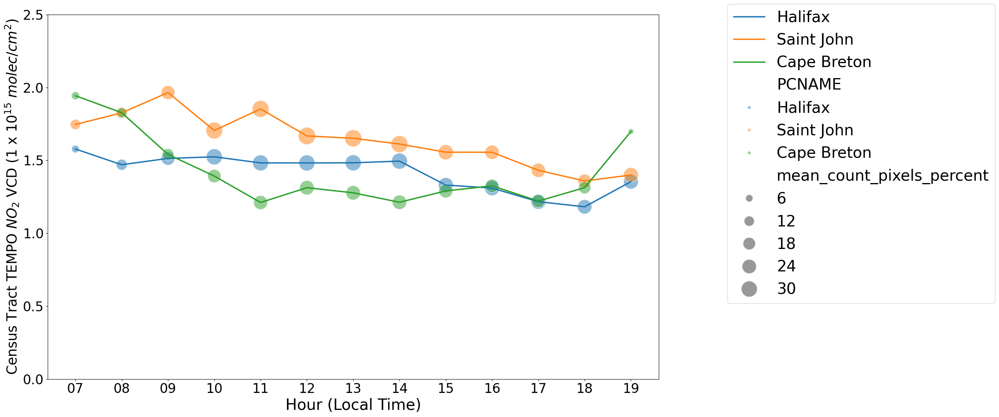

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]

plot_df = weighted_exposure[(weighted_exposure["days"] == "weekday") &
                             (weighted_exposure["PCNAME"].isin(["Halifax", "Saint John", "Cape Breton - Sydney"]))]

plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Halifax", "Saint John", "Cape Breton - Sydney"])

plot_df = plot_df.merge(seasonal_count_pixel_exposure.groupby(['city','wday','hour']).agg({'mean_count_pixels': np.sum}).reset_index(),
                        how = "left", left_on = ["PCNAME","days","hour"], right_on = ["city","wday","hour"])

plot_df = plot_df.merge(atl_time.groupby(['city','wday','hour']).agg({'value': np.sum}).reset_index(),
                        how = "left", on = ["city","wday","hour"])

plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.lineplot(
    data = plot_df,
    x = "hour", y = "population_weighted_no2", hue="PCNAME",
    marker = "none", linewidth=2.5,
)
seaborn.scatterplot(
    data = plot_df,
    x = "hour", y = "population_weighted_no2", hue="PCNAME", size = "mean_count_pixels_percent", sizes=(100, 1000), alpha=0.5,
    # legend = False
)

plt.ylabel("Census Tract TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=25)
plt.xlabel("Hour (Local Time)", size=28)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.ylim(bottom=0, top=2.5)
plt.legend(title="", prop={'size': 28}, bbox_to_anchor=(1.1, 1.05))

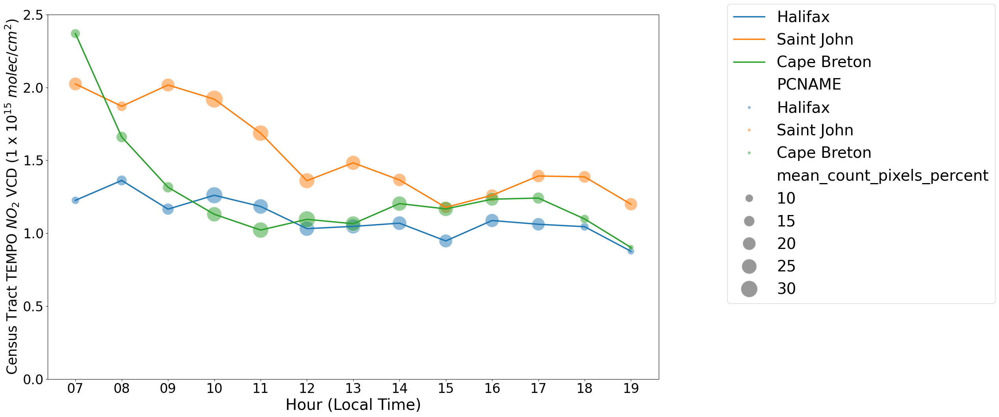

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]

plot_df = weighted_exposure[(weighted_exposure["days"] == "weekend") &
                             (weighted_exposure["PCNAME"].isin(["Halifax", "Saint John", "Cape Breton - Sydney"]))]

plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Halifax", "Saint John", "Cape Breton - Sydney"])

plot_df = plot_df.merge(seasonal_count_pixel_exposure.groupby(['city','wday','hour']).agg({'mean_count_pixels': np.sum}).reset_index(),
                        how = "left", left_on = ["PCNAME","days","hour"], right_on = ["city","wday","hour"])

plot_df = plot_df.merge(atl_time.groupby(['city','wday','hour']).agg({'value': np.sum}).reset_index(),
                        how = "left", on = ["city","wday","hour"])

plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.lineplot(
    data = plot_df,
    x = "hour", y = "population_weighted_no2", hue="PCNAME",
    marker = "none", linewidth=2.5,
)
seaborn.scatterplot(
    data = plot_df,
    x = "hour", y = "population_weighted_no2", hue="PCNAME", size = "mean_count_pixels_percent", sizes=(100, 1000), alpha=0.5,
    # legend = False
)

plt.ylabel("Census Tract TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=25)
plt.xlabel("Hour (Local Time)", size=28)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.ylim(bottom=0, top=2.5)
plt.legend(title="", prop={'size': 28}, bbox_to_anchor=(1.1, 1.05))

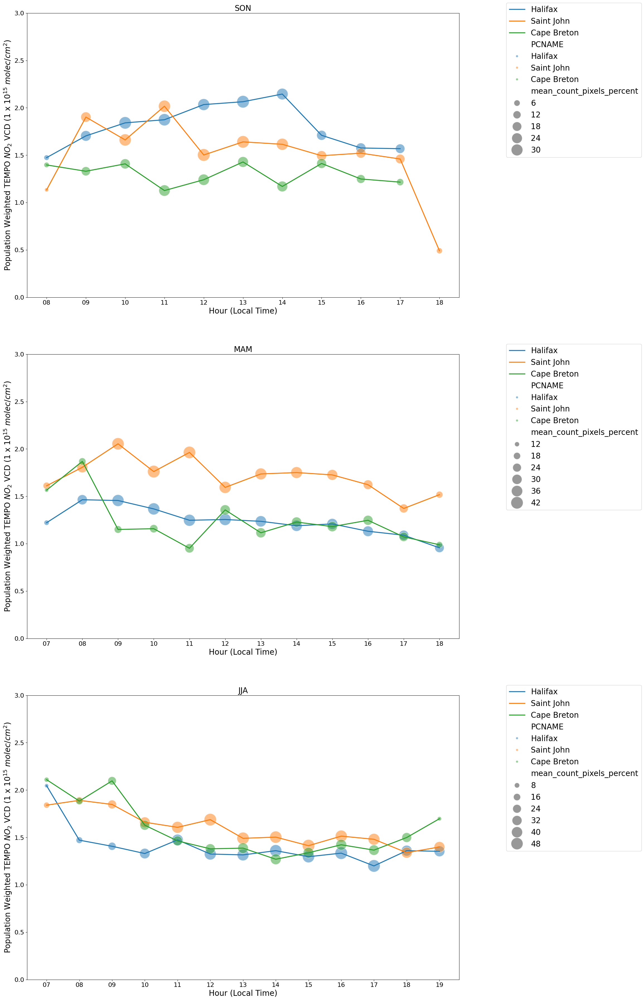

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(20, 45))

seasons = ["SON","MAM","JJA"]

max_val = np.max([
    np.nanmax(seasonal_weighted_exposure[s][(seasonal_weighted_exposure[s]["days"] == "weekday") &
                                            (seasonal_weighted_exposure[s]["PCNAME"].isin(["Halifax", "Saint John", "Cape Breton - Sydney"]))]["population_weighted_no2"])
    for s in seasons]
)

c_count = 0

for s in seasons:

    plot_df = seasonal_weighted_exposure[s][(seasonal_weighted_exposure[s]["days"] == "weekday") &
                                            (seasonal_weighted_exposure[s]["PCNAME"].isin(["Halifax", "Saint John", "Cape Breton - Sydney"]))]

    plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Halifax", "Saint John", "Cape Breton - Sydney"])
    plot_df['season'] = s

    plot_df = plot_df.merge(seasonal_count_pixel_exposure,
                            how = "left", left_on = ["PCNAME","season","days","hour"], right_on = ["city","season","wday","hour"])

    plot_df = plot_df.merge(atl_time.groupby(['season','city','wday','hour']).agg({'value': np.sum}).reset_index(),
                            how = "left", on = ['season',"city","wday","hour"])

    plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

    plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

    seaborn.lineplot(
        data = plot_df,
        x = "hour", y = "population_weighted_no2", hue="PCNAME",
        marker = "none", linewidth=2.5,
        ax = ax[c_count]
    )
    seaborn.scatterplot(
        data = plot_df,
        x = "hour", y = "population_weighted_no2", hue="PCNAME", size = "mean_count_pixels_percent", sizes=(100, 1000), alpha=0.5,
        # legend = False,
        ax = ax[c_count]
    )

    ax[c_count].set_ylim(0, round(max_val, 0) + 1)
    ax[c_count].set_ylabel("Population Weighted TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=20)
    ax[c_count].set_xlabel("Hour (Local Time)", size=20)
    ax[c_count].set_title(s, size=20)
    ax[c_count].tick_params(axis='both', which='major', labelsize=16)
    ax[c_count].legend(title="", prop={'size': 20}, bbox_to_anchor=(1.1, 1.05))


    c_count += 1

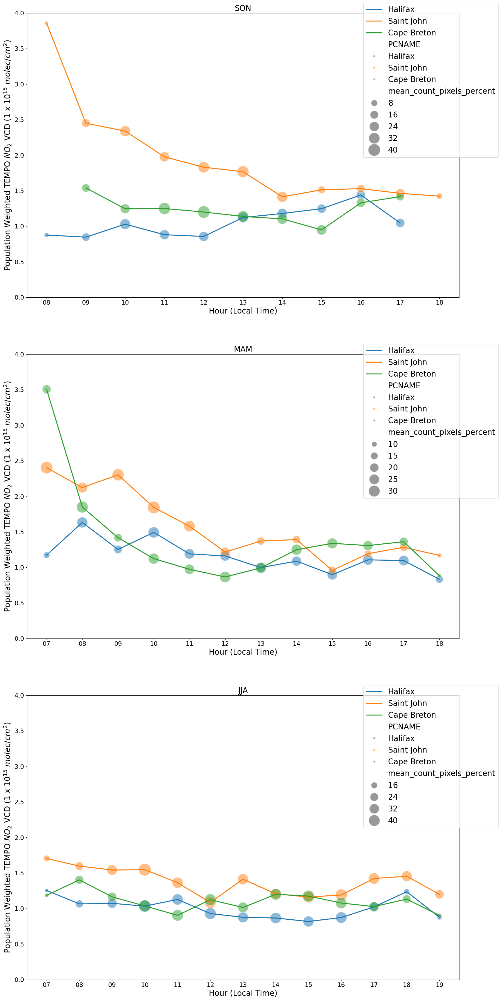

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(20, 45))

seasons = ["SON","MAM","JJA"]

max_val = np.max([
    np.nanmax(seasonal_weighted_exposure[s][(seasonal_weighted_exposure[s]["days"] == "weekend") &
                                            (seasonal_weighted_exposure[s]["PCNAME"].isin(["Halifax", "Saint John", "Cape Breton - Sydney"]))]["population_weighted_no2"])
    for s in seasons]
)

c_count = 0

for s in seasons:

    plot_df = seasonal_weighted_exposure[s][(seasonal_weighted_exposure[s]["days"] == "weekend") &
                                            (seasonal_weighted_exposure[s]["PCNAME"].isin(["Halifax", "Saint John", "Cape Breton - Sydney"]))]

    plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Halifax", "Saint John", "Cape Breton - Sydney"])
    plot_df['season'] = s

    plot_df = plot_df.merge(seasonal_count_pixel_exposure,
                            how = "left", left_on = ["PCNAME","season","days","hour"], right_on = ["city","season","wday","hour"])

    plot_df = plot_df.merge(atl_time.groupby(['season','city','wday','hour']).agg({'value': np.sum}).reset_index(),
                            how = "left", on = ['season',"city","wday","hour"])

    plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

    plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

    seaborn.lineplot(
        data = plot_df,
        x = "hour", y = "population_weighted_no2", hue="PCNAME",
        marker = "none", linewidth=2.5,
        ax = ax[c_count]
    )
    seaborn.scatterplot(
        data = plot_df,
        x = "hour", y = "population_weighted_no2", hue="PCNAME", size = "mean_count_pixels_percent", sizes=(100, 1000), alpha=0.5,
        # legend = False,
        ax = ax[c_count]
    )

    ax[c_count].set_ylim(0, round(max_val, 0))
    ax[c_count].set_ylabel("Population Weighted TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=20)
    ax[c_count].set_xlabel("Hour (Local Time)", size=20)
    ax[c_count].set_title(s, size=20)
    ax[c_count].tick_params(axis='both', which='major', labelsize=16)
    ax[c_count].legend(title="", prop={'size': 20}, bbox_to_anchor=(1.1, 1.05))


    c_count += 1

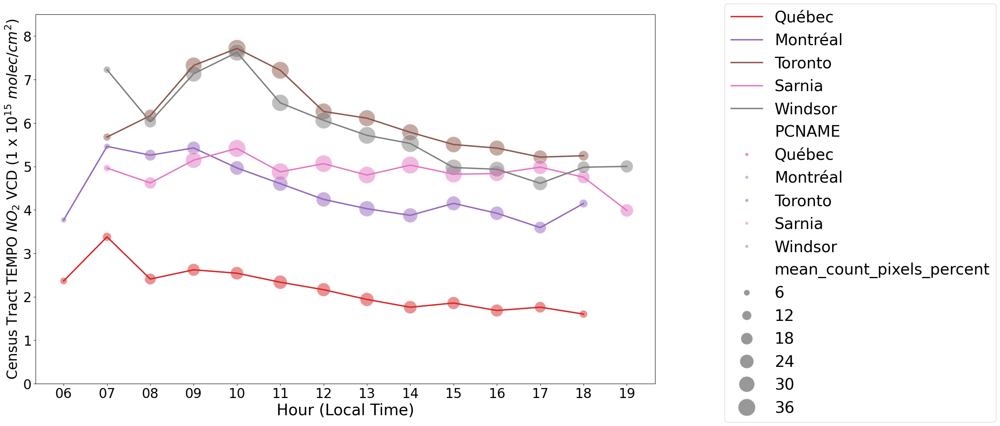

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]

plot_df = weighted_exposure[(weighted_exposure["days"] == "weekday") &
                             (weighted_exposure["PCNAME"].isin(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]))]

plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"])

plot_df = plot_df.merge(seasonal_count_pixel_exposure.groupby(['city','wday','hour']).agg({'mean_count_pixels': np.sum}).reset_index(),
                        how = "left", left_on = ["PCNAME","days","hour"], right_on = ["city","wday","hour"])

plot_df = plot_df.merge(qw_time.groupby(['city','wday','hour']).agg({'value': np.sum}).reset_index(),
                        how = "left", on = ["city","wday","hour"])

plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.lineplot(
    data = plot_df,
    x = "hour", y = "population_weighted_no2", hue="PCNAME",
    marker = "none", linewidth=2.5,
    palette = np.array(seaborn.color_palette())[3:],
)
seaborn.scatterplot(
    data = plot_df,
    x = "hour", y = "population_weighted_no2", hue="PCNAME", size = "mean_count_pixels_percent", sizes=(100, 1000), alpha=0.5,
    # legend = False,
    palette = np.array(seaborn.color_palette())[3:],
)

plt.ylabel("Census Tract TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=25)
plt.xlabel("Hour (Local Time)", size=28)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.ylim(bottom=0, top=8.5)
plt.legend(title="", prop={'size': 28}, bbox_to_anchor=(1.1, 1.05))

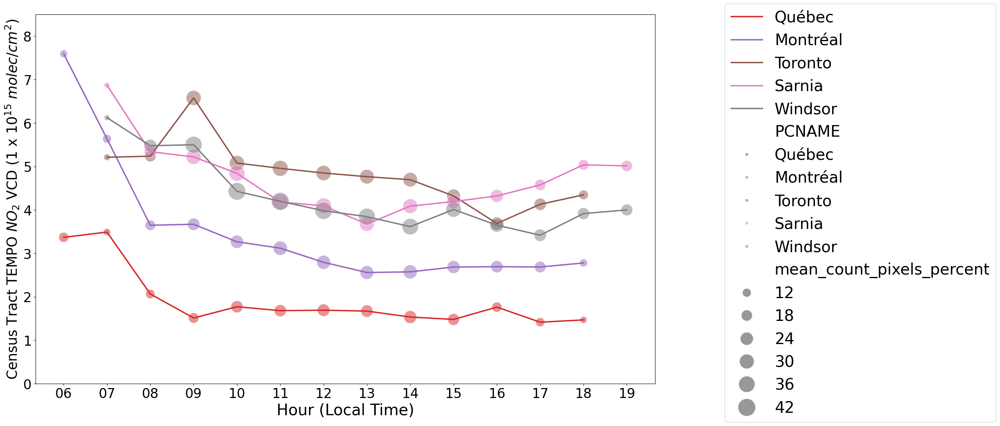

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]

plot_df = weighted_exposure[(weighted_exposure["days"] == "weekend") &
                             (weighted_exposure["PCNAME"].isin(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]))]

plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"])

plot_df = plot_df.merge(seasonal_count_pixel_exposure.groupby(['city','wday','hour']).agg({'mean_count_pixels': np.sum}).reset_index(),
                        how = "left", left_on = ["PCNAME","days","hour"], right_on = ["city","wday","hour"])

plot_df = plot_df.merge(qw_time.groupby(['city','wday','hour']).agg({'value': np.sum}).reset_index(),
                        how = "left", on = ["city","wday","hour"])

plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.lineplot(
    data = plot_df,
    x = "hour", y = "population_weighted_no2", hue="PCNAME",
    marker = "none", linewidth=2.5,
    palette = np.array(seaborn.color_palette())[3:],
)
seaborn.scatterplot(
    data = plot_df,
    x = "hour", y = "population_weighted_no2", hue="PCNAME", size = "mean_count_pixels_percent", sizes=(100, 1000), alpha=0.5,
    # legend = False,
    palette = np.array(seaborn.color_palette())[3:],
)

plt.ylabel("Census Tract TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=25)
plt.xlabel("Hour (Local Time)", size=28)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.ylim(bottom=0, top=8.5)
plt.legend(title="", prop={'size': 28}, bbox_to_anchor=(1.1, 1.05))

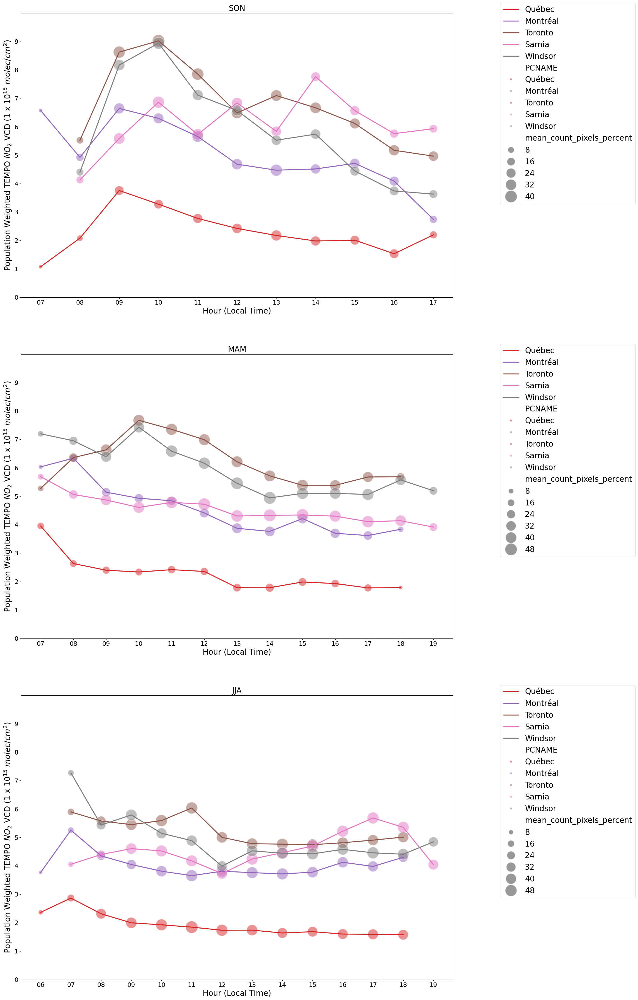

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(20, 45))

seasons = ["SON","MAM","JJA"]

max_val = np.max([
    np.nanmax(seasonal_weighted_exposure[s][(seasonal_weighted_exposure[s]["days"] == "weekday") &
                                            (seasonal_weighted_exposure[s]["PCNAME"].isin(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]))]["population_weighted_no2"])
    for s in seasons]
)

cmap = colors.ListedColormap(plt.cm.tab10.colors[3:])

c_count = 0

for s in seasons:

    plot_df = seasonal_weighted_exposure[s][(seasonal_weighted_exposure[s]["days"] == "weekday") &
                                            (seasonal_weighted_exposure[s]["PCNAME"].isin(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]))]

    plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"])
    plot_df['season'] = s

    plot_df = plot_df.merge(seasonal_count_pixel_exposure,
                            how = "left", left_on = ["PCNAME","season","days","hour"], right_on = ["city","season","wday","hour"])

    plot_df = plot_df.merge(qw_time.groupby(['season','city','wday','hour']).agg({'value': np.sum}).reset_index(),
                            how = "left", on = ['season',"city","wday","hour"])

    plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

    plot_df['hour'] = plot_df['hour'].astype("category").cat.set_categories(sorted(list(set(plot_df['hour']))))

    seaborn.lineplot(
        data = plot_df,
        x = "hour", y = "population_weighted_no2", hue="PCNAME",
        marker = "none", linewidth=2.5,
        palette = np.array(seaborn.color_palette())[3:],
        ax = ax[c_count]
    )
    seaborn.scatterplot(
        data = plot_df,
        x = "hour", y = "population_weighted_no2", hue="PCNAME", size = "mean_count_pixels_percent", sizes=(100, 1000), alpha=0.5,
        # legend = False,
        palette = np.array(seaborn.color_palette())[3:],
        ax = ax[c_count]
    )

    ax[c_count].set_ylim(0, round(max_val, 0)+1)
    ax[c_count].set_ylabel("Population Weighted TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=20)
    ax[c_count].set_xlabel("Hour (Local Time)", size=20)
    ax[c_count].set_title(s, size=20)
    ax[c_count].tick_params(axis='both', which='major', labelsize=16)
    ax[c_count].legend(title="", prop={'size': 20}, bbox_to_anchor=(1.1, 1.05))
    ax[c_count].set_yticks(np.arange(0, round(max_val, 0)+1, 1))

    c_count += 1

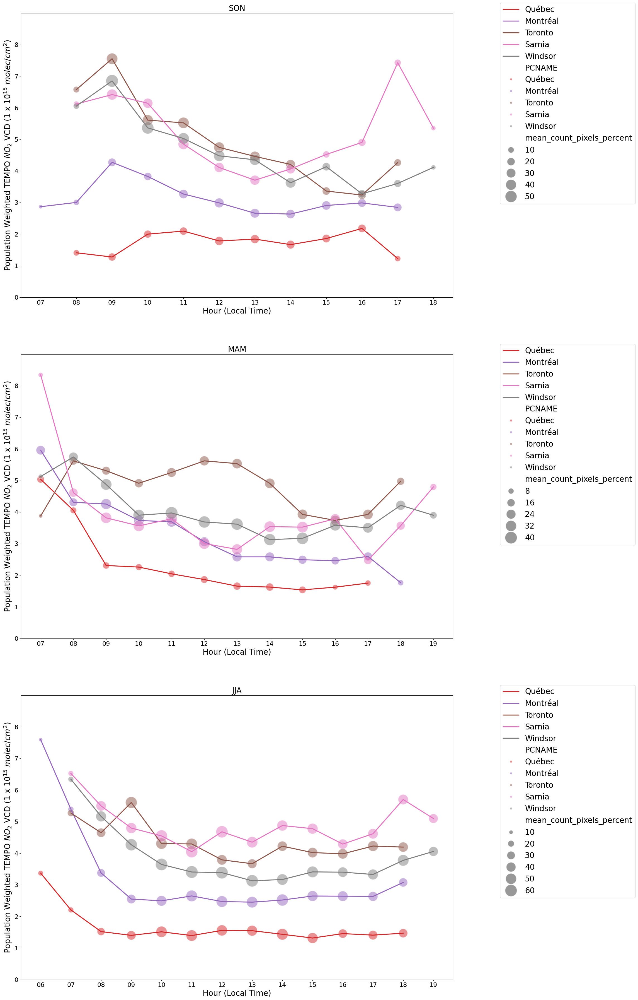

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(20, 45))

seasons = ["SON","MAM","JJA"]

max_val = np.max([
    np.nanmax(seasonal_weighted_exposure[s][(seasonal_weighted_exposure[s]["days"] == "weekend") &
                                            (seasonal_weighted_exposure[s]["PCNAME"].isin(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]))]["population_weighted_no2"])
    for s in seasons]
)

cmap = colors.ListedColormap(plt.cm.tab10.colors[3:])

c_count = 0

for s in seasons:

    plot_df = seasonal_weighted_exposure[s][(seasonal_weighted_exposure[s]["days"] == "weekend") &
                                            (seasonal_weighted_exposure[s]["PCNAME"].isin(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]))]

    plot_df['PCNAME'] = plot_df['PCNAME'].astype("category").cat.set_categories(["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"])
    plot_df['season'] = s

    plot_df = plot_df.merge(seasonal_count_pixel_exposure,
                            how = "left", left_on = ["PCNAME","season","days","hour"], right_on = ["city","season","wday","hour"])

    plot_df = plot_df.merge(qw_time.groupby(['season','city','wday','hour']).agg({'value': np.sum}).reset_index(),
                            how = "left", on = ['season',"city","wday","hour"])

    plot_df['mean_count_pixels_percent'] = plot_df['mean_count_pixels'] / plot_df['value'] * 100

    plot_df['hour'] = plot_df['hour'].astype("category").cat.set_categories(sorted(list(set(plot_df['hour']))))

    seaborn.lineplot(
        data = plot_df,
        x = "hour", y = "population_weighted_no2", hue="PCNAME",
        marker = "none", linewidth=2.5,
        palette = np.array(seaborn.color_palette())[3:],
        ax = ax[c_count]
    )
    seaborn.scatterplot(
        data = plot_df,
        x = "hour", y = "population_weighted_no2", hue="PCNAME", size = "mean_count_pixels_percent", sizes=(100, 1000), alpha=0.5,
        # legend = False,
        palette = np.array(seaborn.color_palette())[3:],
        ax = ax[c_count]
    )

    ax[c_count].set_ylim(0, round(max_val, 0)+1)
    ax[c_count].set_ylabel("Population Weighted TEMPO " + "$NO_{2}$" + " VCD (1 x " + "$10^{15}$ " + "$  molec/cm^{2})$", size=20)
    ax[c_count].set_xlabel("Hour (Local Time)", size=20)
    ax[c_count].set_title(s, size=20)
    ax[c_count].tick_params(axis='both', which='major', labelsize=16)
    ax[c_count].legend(title="", prop={'size': 20}, bbox_to_anchor=(1.1, 1.05))
    ax[c_count].set_yticks(np.arange(0, round(max_val, 0)+1, 1))

    c_count += 1

#### **3) Diurnal Hourly NO<sub>2</sub> Differences stratified by Seasons and Weekday-Weekend groups:**

In [ ]:
def make_wkday_hour_delta(city, no2_dayhour_agg, coords_arr, census_unit_data, population_data):

    coords_gdf = gpd.GeoDataFrame({
        "longitude": coords_arr[:,:,0].flatten(),
        "latitude": coords_arr[:,:,1].flatten(),
    })

    ##  interpolated grids at 0.002 x 0.002 (200 m x 200 m) within each city

    city_xr = xr.Dataset.from_dataframe(pc_grids_coords[city].set_index(['lon','lat'])).drop_vars('geometry')
    city_xr = city_xr.rio.write_crs("epsg:4326")
    city_xr = city_xr.rename({"lon": "x", "lat": "y"})
    city_xr = city_xr.transpose("y", "x")
    city_xr = city_xr.reindex(y=list(reversed(city_xr.y)))

    ##  extract area-weighted mean TEMPO tropospheric NO2 VCD Difference stratified by weekday-weekend split and hourly intervals

    for k in zip(sorted(no2_dayhour_agg.keys())[0:-1],
                 sorted(no2_dayhour_agg.keys())[1:]):

        for w in ["weekday", "weekend"]:

            if len(no2_dayhour_agg[k[0]][w].shape) > 0:
                no2_dayhour_agg[k[0]][w] = fetch_plot_Xr(no2_dayhour_agg[k[0]][w], coords)
            else:
                no2_dayhour_agg[k[0]][w] = np.empty((coord_xr.shape[0], coord_xr.shape[1]))
                no2_dayhour_agg[k[0]][w][:] = np.nan
                no2_dayhour_agg[k[0]][w] = fetch_plot_Xr(no2_dayhour_agg[k[0]][w], coords)

            if len(no2_dayhour_agg[k[1]][w].shape) > 0:
                no2_dayhour_agg[k[1]][w] = fetch_plot_Xr(no2_dayhour_agg[k[1]][w], coords)
            else:
                no2_dayhour_agg[k[1]][w] = np.empty((coord_xr.shape[0], coord_xr.shape[1]))
                no2_dayhour_agg[k[1]][w][:] = np.nan
                no2_dayhour_agg[k[1]][w] = fetch_plot_Xr(no2_dayhour_agg[k[1]][w], coords)

            city_interp_a = city_subset(city, no2_dayhour_progress_agg_qw[k[0]][w])
            city_interp_b = city_subset(city, no2_dayhour_progress_agg_qw[k[1]][w])

            #  i)  magnitude difference
            city_interp = city_interp_b - city_interp_a
            city_zs = eet.exact_extract(city_interp, census_unit_data[city], 'mean')
            city_zs = [city_zs[n]['properties']['mean'] for n in range(census_unit_data[city].shape[0])]
            census_unit_data[city]["tempo_no2_1st_diff_" + "hour_" + k[0] + "-" + k[1] + "_" + w] = pd.Series(city_zs)

            #  ii)  percentage difference

            city_interp = (city_interp_b - city_interp_a) / city_interp_a * 100
            city_zs = eet.exact_extract(city_interp, census_unit_data[city], 'mean')
            city_zs = [city_zs[n]['properties']['mean'] for n in range(census_unit_data[city].shape[0])]
            census_unit_data[city]["tempo_no2_1st_diff_perc_" + "hour_" + k[0] + "-" + k[1] + "_" + w] = pd.Series(city_zs)

    ##  merge with census unit population in 2021

    census_unit_data[city] = census_unit_data[city].merge(population_data[["DGUID","Population"]], on="DGUID", how="left")

    out = pd.melt(census_unit_data[city], id_vars=["DGUID","geometry","PCNAME","included","Population"])
    out["hour"] = out["variable"].apply(lambda x: x.replace("tempo_no2_1st_diff_","").replace("hour_","").replace("perc_","").split("_")[0])
    out["days"] = out["variable"].apply(lambda x: x.replace("tempo_no2_1st_diff_","").replace("hour_","").replace("perc_","").split("_")[1])
    out["value_format"] = out["variable"].apply(lambda x: "percentage" if "perc" in x else "magnitude")
    out = out[(out["Population"] > 0) & (~pd.isnull(out['value']))].reset_index(drop=True)

    ##  compute census population weighted NO2 hour-by-hour differences

    weighted = out.groupby(['PCNAME','hour','days',"value_format"]).agg(
        no2_delta = ("value", lambda x: np.average(x, weights = tem.loc[x.index, "Population"]))
    ).reset_index()

    weighted = pd.pivot_table(weighted, index=['PCNAME','hour','days'], columns=["value_format"], values=["no2_delta"]).reset_index()
    weighted.columns = ['PCNAME','hour','days','no2_delta_magnitude','no2_delta_percentage']

    return weighted

In [ ]:
delta_exposure = []

for city in  ["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:

    if city in ["Halifax", "Saint John"]:
        weighted = make_wkday_hour_delta(
            city, no2_dayhour_agg_atl, coord_atl, within_cts, pop_cts
        )
    elif city in ["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:
        weighted = make_wkday_hour_delta(
            city, no2_dayhour_agg_qw, coord_qw, within_cts, pop_cts
        )
    else:
        weighted = make_wkday_hour_delta(
            city, no2_dayhour_agg_atl, coord_atl, within_das, pop_das
        )

    delta_exposure.append(weighted)

delta_exposure = pd.concat(delta_exposure)
delta_exposure['no2_delta_magnitude'] = delta_exposure['no2_delta_magnitude'] / 1e15

delta_exposure['PCNAME'] = delta_exposure['PCNAME'].astype("category").cat.set_categories(["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"])

In [ ]:
seasons = ["SON","DJF","MAM","JJA"]
seasonal_delta = {}

for s in seasons:

    s_weighted_delta = []

    for city in  ["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:

        if city in ["Halifax", "Saint John"]:
            weighted = make_wkday_hour_delta(
                city, no2_seasonal_dayhour_agg_atl, coord_atl, within_cts, pop_cts
            )
        elif city in ["Québec", "Montréal", "Toronto", "Sarnia", "Windsor"]:
            weighted = make_wkday_hour_delta(
                city, no2_seasonal_dayhour_agg_qw, coord_qw, within_cts, pop_cts
            )
        else:
            weighted = make_wkday_hour_delta(
                city, no2_seasonal_dayhour_agg_atl, coord_atl, within_das, pop_das
            )

        s_weighted_delta.append(weighted)


    weighted_delta = pd.concat(s_weighted_delta)
    weighted_delta['no2_delta_magnitude'] = weighted_delta['no2_delta_magnitude'] / 1e15
    weighted_delta['PCNAME'] = weighted_delta['PCNAME'].astype("category").cat.set_categories(["Halifax", "Saint John", "Cape Breton - Sydney", "Québec", "Montréal", "Toronto", "Sarnia", "Windsor"])

    seasonal_delta[s] = weighted_delta

<Axes: xlabel='hour', ylabel='PCNAME'>

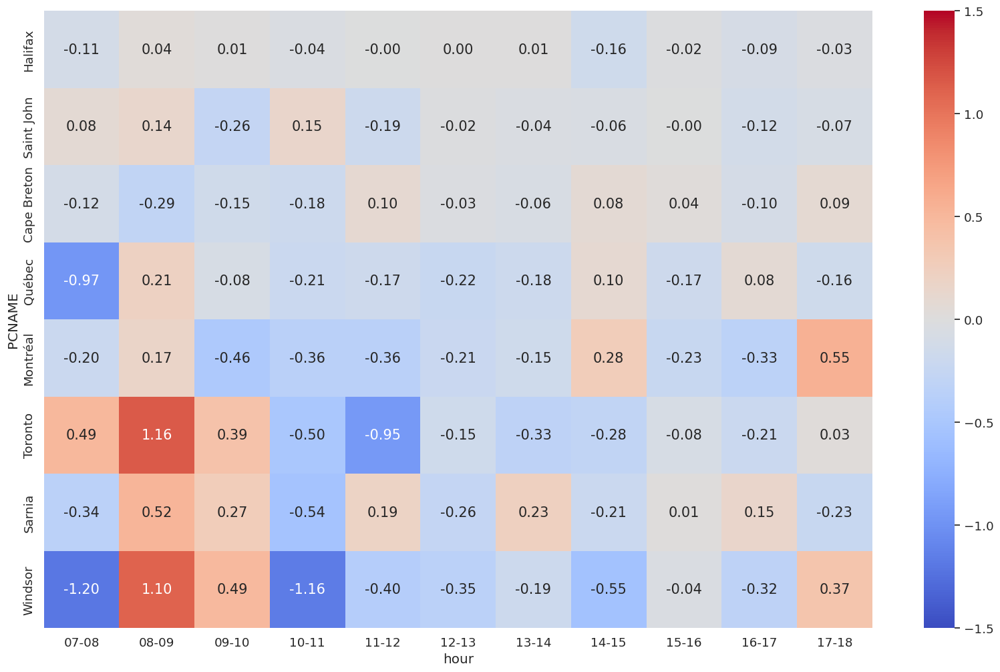

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]
seaborn.set(font_scale=1.2)

plot_df = delta_exposure[
    (delta_exposure["days"] == "weekday") &
    (delta_exposure["hour"] != "06-07") &
    (delta_exposure["hour"] != "18-19")
]

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.heatmap(plot_df.pivot(index="PCNAME", columns="hour", values="no2_delta_magnitude"),
                annot=True, annot_kws={"size": 15}, xticklabels=True, yticklabels=True,
                fmt=".2f", cmap="coolwarm", vmin=-1.5, vmax=1.5)

<Axes: xlabel='hour', ylabel='PCNAME'>

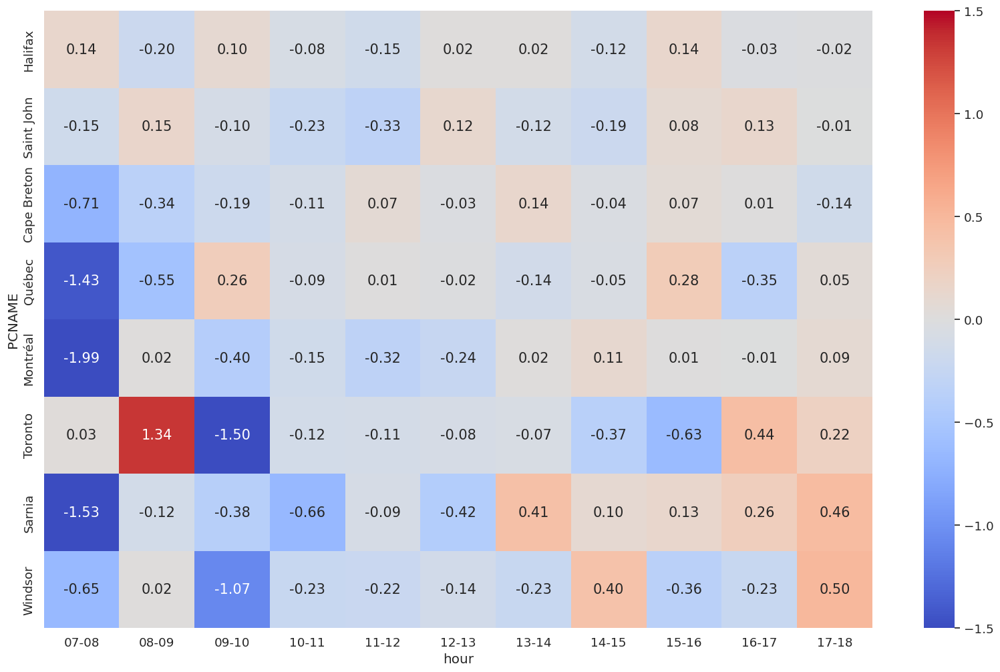

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]
seaborn.set(font_scale=1.2)

plot_df = delta_exposure[
    (delta_exposure["days"] == "weekend") &
    (delta_exposure["hour"] != "06-07") &
    (delta_exposure["hour"] != "18-19")
]

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.heatmap(plot_df.pivot(index="PCNAME", columns="hour", values="no2_delta_magnitude"),
                annot=True, annot_kws={"size": 15}, xticklabels=True, yticklabels=True,
                fmt=".2f", cmap="coolwarm", vmin=-1.5, vmax=1.5)

<Axes: xlabel='hour', ylabel='PCNAME'>

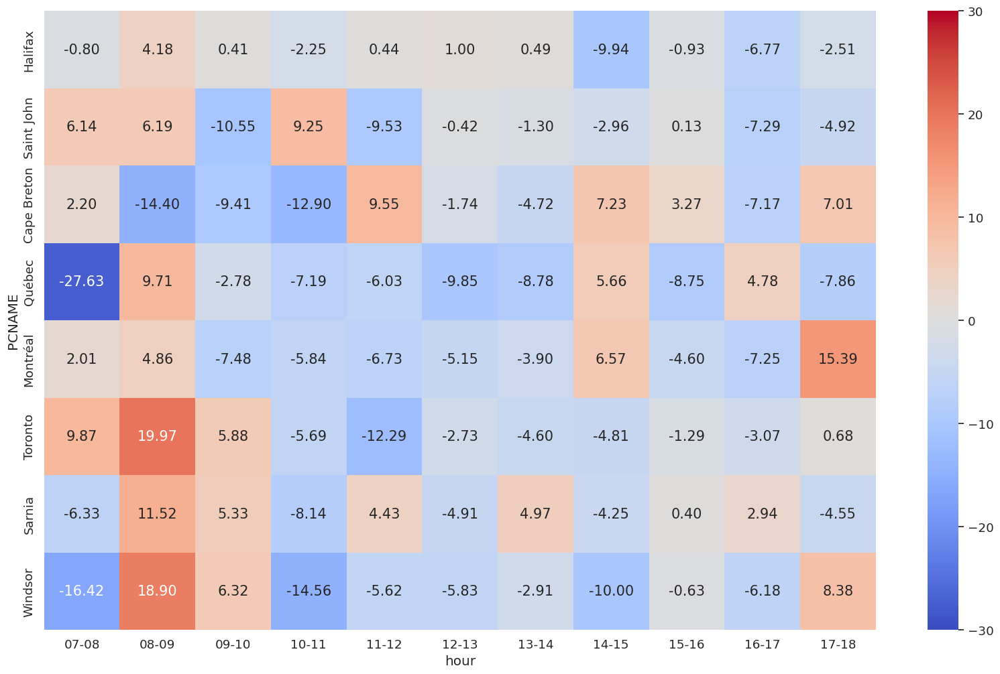

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]
seaborn.set(font_scale=1.2)

plot_df = delta_exposure[
    (delta_exposure["days"] == "weekday") &
    (delta_exposure["hour"] != "06-07") &
    (delta_exposure["hour"] != "18-19")
]

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.heatmap(plot_df.pivot(index="PCNAME", columns="hour", values="no2_delta_percentage"),
                annot=True, annot_kws={"size": 15}, xticklabels=True, yticklabels=True,
                fmt=".2f", cmap="coolwarm", vmin=-30, vmax=30)

<Axes: xlabel='hour', ylabel='PCNAME'>

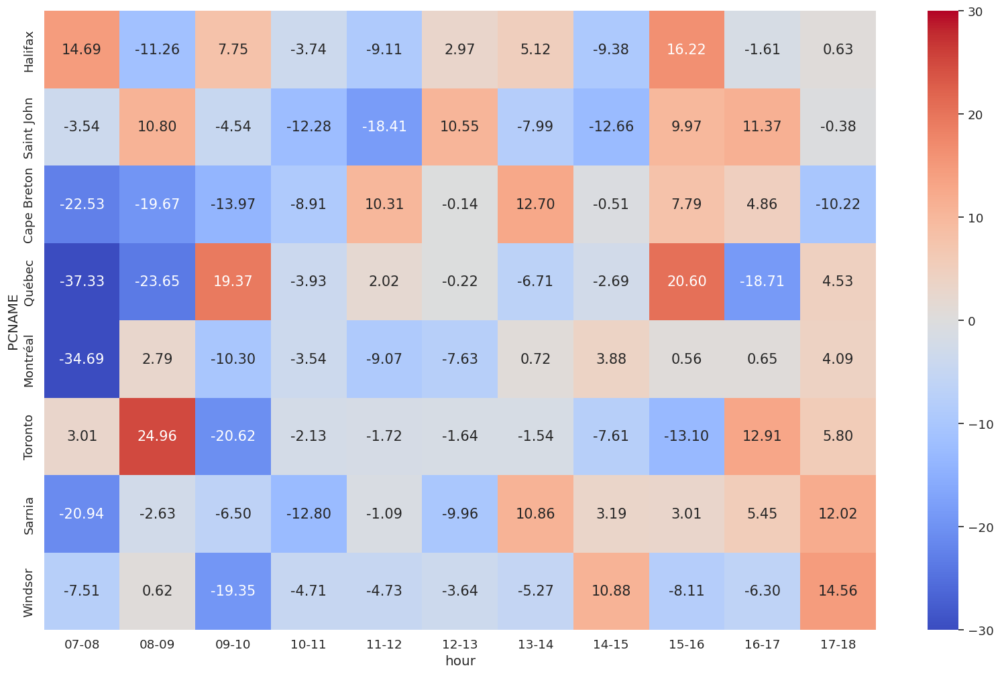

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]
seaborn.set(font_scale=1.2)

plot_df = delta_exposure[
    (delta_exposure["days"] == "weekend") &
    (delta_exposure["hour"] != "06-07") &
    (delta_exposure["hour"] != "18-19")
]

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.heatmap(plot_df.pivot(index="PCNAME", columns="hour", values="no2_delta_percentage"),
                annot=True, annot_kws={"size": 15}, xticklabels=True, yticklabels=True,
                fmt=".2f", cmap="coolwarm", vmin=-30, vmax=30)

<Axes: xlabel='hour', ylabel='PCNAME-season'>

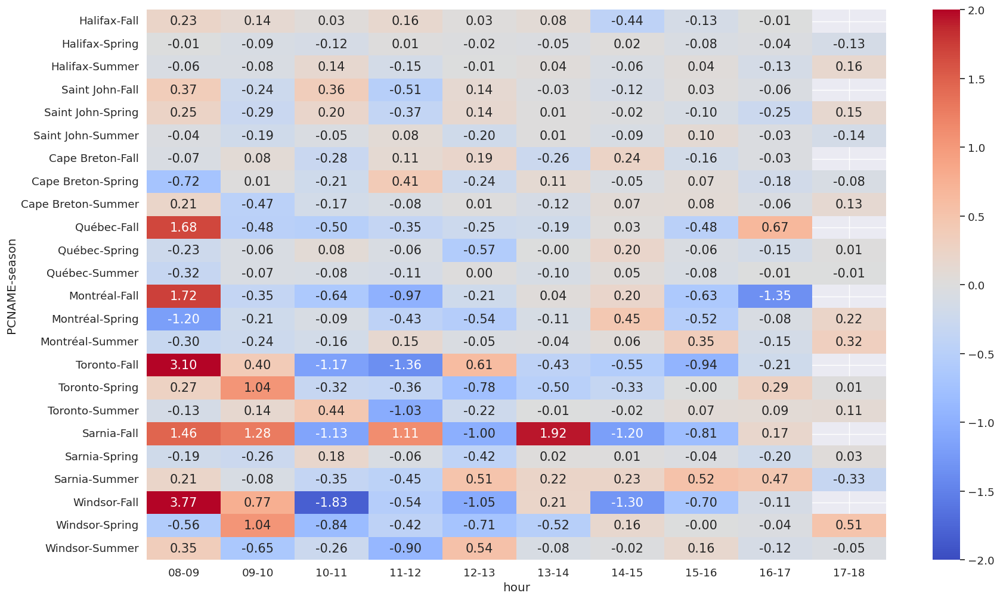

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]
seaborn.set(font_scale=1.2)

df1 = seasonal_delta['SON'][
    (seasonal_delta['SON']["days"] == "weekday") &
    (seasonal_delta['SON']["hour"] != "06-07") &
    (seasonal_delta['SON']["hour"] != "07-08") &
    (seasonal_delta['SON']["hour"] != "17-18") &
    (seasonal_delta['SON']["hour"] != "18-19")
]
df2 = seasonal_delta['MAM'][
    (seasonal_delta['MAM']["days"] == "weekday") &
    (seasonal_delta['MAM']["hour"] != "06-07") &
    (seasonal_delta['MAM']["hour"] != "07-08") &
    (seasonal_delta['MAM']["hour"] != "18-19")
]
df3 = seasonal_delta['JJA'][
    (seasonal_delta['JJA']["days"] == "weekday") &
    (seasonal_delta['JJA']["hour"] != "06-07") &
    (seasonal_delta['JJA']["hour"] != "07-08") &
    (seasonal_delta['JJA']["hour"] != "18-19")
]

df1['season'] = "Fall"
df2['season'] = "Spring"
df3['season'] = "Summer"

plot_df = pd.concat([df1, df2, df3])

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)


seaborn.heatmap(plot_df.pivot(index=["PCNAME", 'season'], columns="hour", values="no2_delta_magnitude"),
                annot=True, annot_kws={"size": 15}, xticklabels=True, yticklabels=True,
                fmt=".2f", cmap="coolwarm", vmin=-2.0, vmax=2.0)

<Axes: xlabel='hour', ylabel='PCNAME-season'>

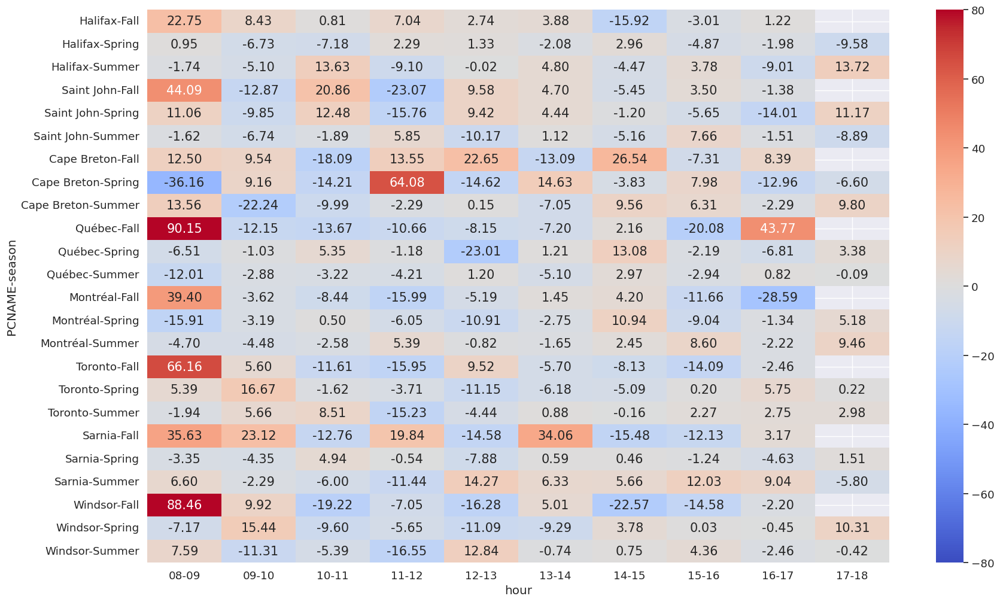

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]
seaborn.set(font_scale=1.2)

df1 = seasonal_delta['SON'][
    (seasonal_delta['SON']["days"] == "weekday") &
    (seasonal_delta['SON']["hour"] != "06-07") &
    (seasonal_delta['SON']["hour"] != "07-08") &
    (seasonal_delta['SON']["hour"] != "17-18") &
    (seasonal_delta['SON']["hour"] != "18-19")
]
df2 = seasonal_delta['MAM'][
    (seasonal_delta['MAM']["days"] == "weekday") &
    (seasonal_delta['MAM']["hour"] != "06-07") &
    (seasonal_delta['MAM']["hour"] != "07-08") &
    (seasonal_delta['MAM']["hour"] != "18-19")
]
df3 = seasonal_delta['JJA'][
    (seasonal_delta['JJA']["days"] == "weekday") &
    (seasonal_delta['JJA']["hour"] != "06-07") &
    (seasonal_delta['JJA']["hour"] != "07-08") &
    (seasonal_delta['JJA']["hour"] != "18-19")
]

df1['season'] = "Fall"
df2['season'] = "Spring"
df3['season'] = "Summer"

plot_df = pd.concat([df1, df2, df3])

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.heatmap(plot_df.pivot(index=["PCNAME", 'season'], columns="hour", values="no2_delta_percentage"),
                annot=True, annot_kws={"size": 15}, xticklabels=True, yticklabels=True,
                fmt=".2f", cmap="coolwarm", vmin=-80, vmax=80)

<Axes: xlabel='hour', ylabel='PCNAME-season'>

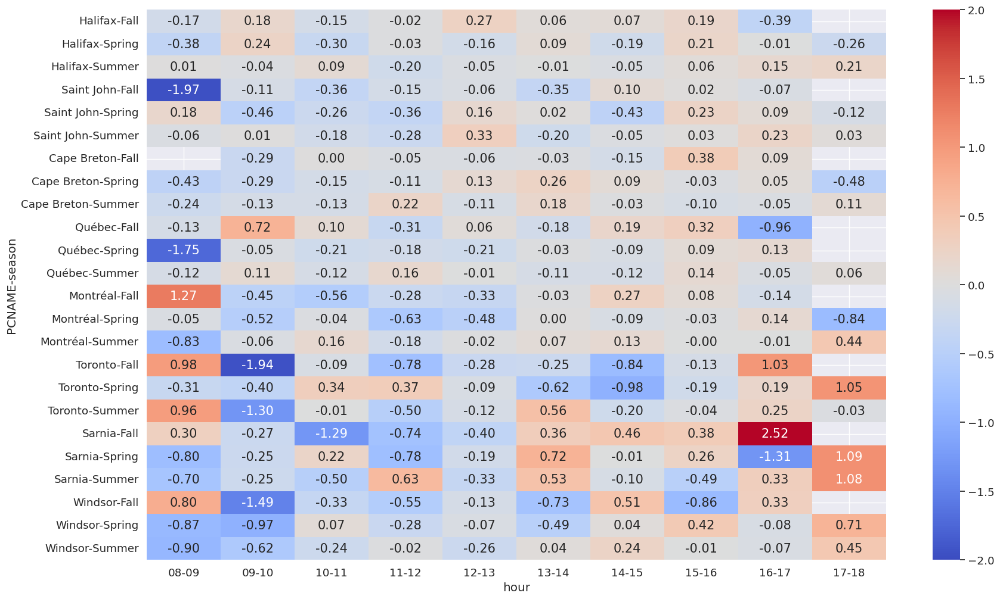

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]
seaborn.set(font_scale=1.2)

df1 = seasonal_delta['SON'][
    (seasonal_delta['SON']["days"] == "weekend") &
    (seasonal_delta['SON']["hour"] != "06-07") &
    (seasonal_delta['SON']["hour"] != "07-08") &
    (seasonal_delta['SON']["hour"] != "17-18") &
    (seasonal_delta['SON']["hour"] != "18-19")
]
df2 = seasonal_delta['MAM'][
    (seasonal_delta['MAM']["days"] == "weekend") &
    (seasonal_delta['MAM']["hour"] != "06-07") &
    (seasonal_delta['MAM']["hour"] != "07-08") &
    (seasonal_delta['MAM']["hour"] != "18-19")
]
df3 = seasonal_delta['JJA'][
    (seasonal_delta['JJA']["days"] == "weekend") &
    (seasonal_delta['JJA']["hour"] != "06-07") &
    (seasonal_delta['JJA']["hour"] != "07-08") &
    (seasonal_delta['JJA']["hour"] != "18-19")
]

df1['season'] = "Fall"
df2['season'] = "Spring"
df3['season'] = "Summer"

plot_df = pd.concat([df1, df2, df3])

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.heatmap(plot_df.pivot(index=["PCNAME", 'season'], columns="hour", values="no2_delta_magnitude"),
                annot=True, annot_kws={"size": 15}, xticklabels=True, yticklabels=True,
                fmt=".2f", cmap="coolwarm", vmin=-2.0, vmax=2.0)

<Axes: xlabel='hour', ylabel='PCNAME-season'>

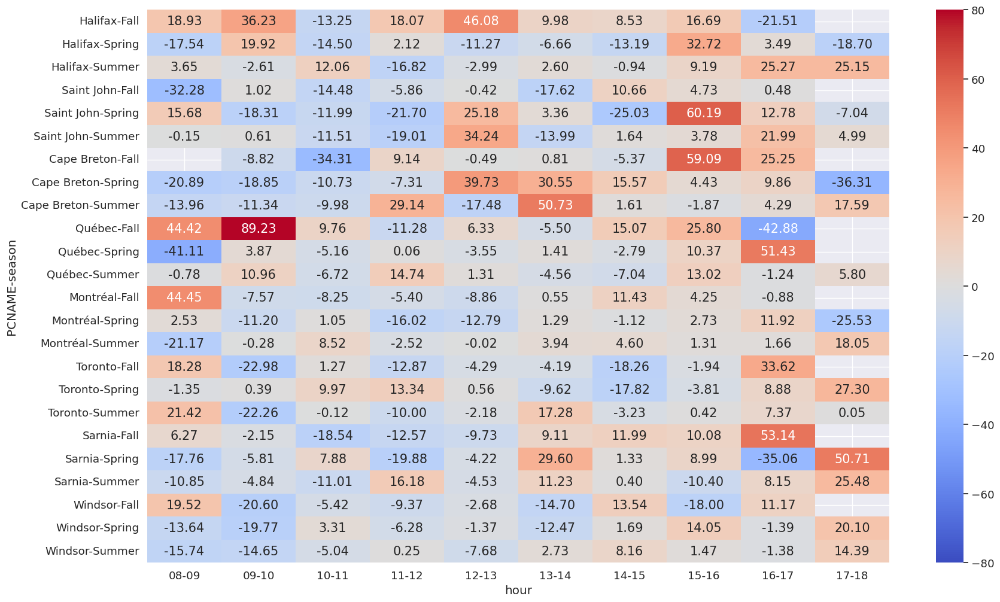

In [ ]:
plt.rcParams["figure.figsize"] = [20,12]
seaborn.set(font_scale=1.2)

df1 = seasonal_delta['SON'][
    (seasonal_delta['SON']["days"] == "weekend") &
    (seasonal_delta['SON']["hour"] != "06-07") &
    (seasonal_delta['SON']["hour"] != "07-08") &
    (seasonal_delta['SON']["hour"] != "17-18") &
    (seasonal_delta['SON']["hour"] != "18-19")
]
df2 = seasonal_delta['MAM'][
    (seasonal_delta['MAM']["days"] == "weekend") &
    (seasonal_delta['MAM']["hour"] != "06-07") &
    (seasonal_delta['MAM']["hour"] != "07-08") &
    (seasonal_delta['MAM']["hour"] != "18-19")
]
df3 = seasonal_delta['JJA'][
    (seasonal_delta['JJA']["days"] == "weekend") &
    (seasonal_delta['JJA']["hour"] != "06-07") &
    (seasonal_delta['JJA']["hour"] != "07-08") &
    (seasonal_delta['JJA']["hour"] != "18-19")
]

df1['season'] = "Fall"
df2['season'] = "Spring"
df3['season'] = "Summer"

plot_df = pd.concat([df1, df2, df3])

plot_df['PCNAME'] = plot_df['PCNAME'].apply(lambda x: x.replace(" - Sydney", "") if x == "Cape Breton - Sydney" else x)

seaborn.heatmap(plot_df.pivot(index=["PCNAME", 'season'], columns="hour", values="no2_delta_percentage"),
                annot=True, annot_kws={"size": 15}, xticklabels=True, yticklabels=True,
                fmt=".2f", cmap="coolwarm", vmin=-80, vmax=80)